The approach:

1. Prepare a cloud-free mosaic of WV3 that is closest to the lidar collection date. Ideally, it would be from 2018. But 2019 or 2020 are also OK.
2. Apply atmospheric correction (FLAASH) and pansharpen.
3. Georeference CHM and WV3 to Sentinel 2 data.

1. Create and apply a 1m CHM mask to WV3 imagery
2. Segment entire image (this may be infeasable... if so, will need to tile and deal with edge artifacts)
3. Extract spectral signatures of each species within segments
4. 

`gdal_merge.py -o output_raster.tif input_raster1.tif input_raster2.tif input_raster3.tif `

In [1]:
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from rasterstats import zonal_stats

In [2]:
import sys

sys.path.append('/home/milo/repos/obia')
from obia.handlers import open_geotiff
from obia.segment import ImageSegments
from obia.classify import classify

Tiles were loaded and then training values were assigned using a GIS:
```python
for i in range(1,16):
    raster_path = f"/mnt/c/tmp/trial_tiles/plt{i}.tif"
    img = open_geotiff(raster_path, bands=[8,7,5])
    segmented_image = ImageSegments(img, method="slic", n_segments=15000, compactness=10, max_num_iter=100, sigma=0.5, convert2lab=True, slic_zero=True)
    segmented_image.write_segments(f'/mnt/c/tmp/trial_tiles/segments_plt{i}.geojson')
```

In [10]:
for i in range(1,16):
    if i == 9:
        continue
    raster_path = f"/mnt/c/tmp/trial_tiles_2/plt{i}.tif"
    img = open_geotiff(raster_path, bands=[8,5,2])
    segmented_image = ImageSegments(img, method="slic", n_segments=25000, compactness=10, max_num_iter=100, sigma=0.5, convert2lab=True, slic_zero=True)
    segmented_image.write_segments(f'/mnt/c/tmp/trial_tiles_2/segments_plt{i}.geojson')


Analyzing Segments: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████
Analyzing Segments: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████
Analyzing Segments: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████
Analyzing Segments: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████
Analyzing Segments: 100%|███████████████████████████████████████████████████████████

In [11]:
raster_path = f"/mnt/c/tmp/trial_tiles_2/plt9.tif"
img = open_geotiff(raster_path, bands=[8,5,2])
segmented_image = ImageSegments(img, method="slic", n_segments=25000, compactness=10, max_num_iter=100, sigma=0.5, convert2lab=True, slic_zero=True)
# segmented_image.write_segments(f'/mnt/c/tmp/trial_tiles_2/plt9.geojson')

Analyzing Segments: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████


PermissionError: [Errno 13] Permission denied: '/mnt/c/tmp/trial_tiles_2/plt9.geojson'

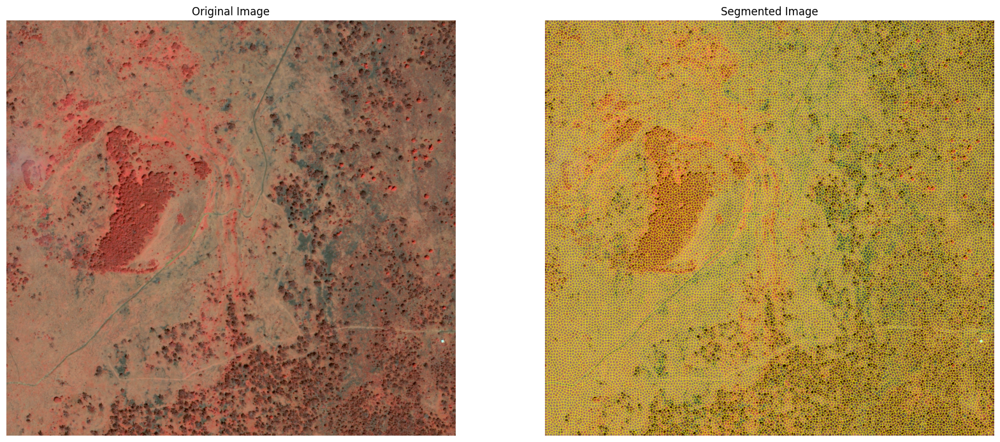

In [12]:
fig, axs = plt.subplots(1, 2, figsize=(20, 10))

axs[0].imshow(img.img)
axs[0].axis('off')
axs[0].set_title('Original Image') 

axs[1].imshow(segmented_image.img)
axs[1].axis('off')
axs[1].set_title('Segmented Image')

plt.show()

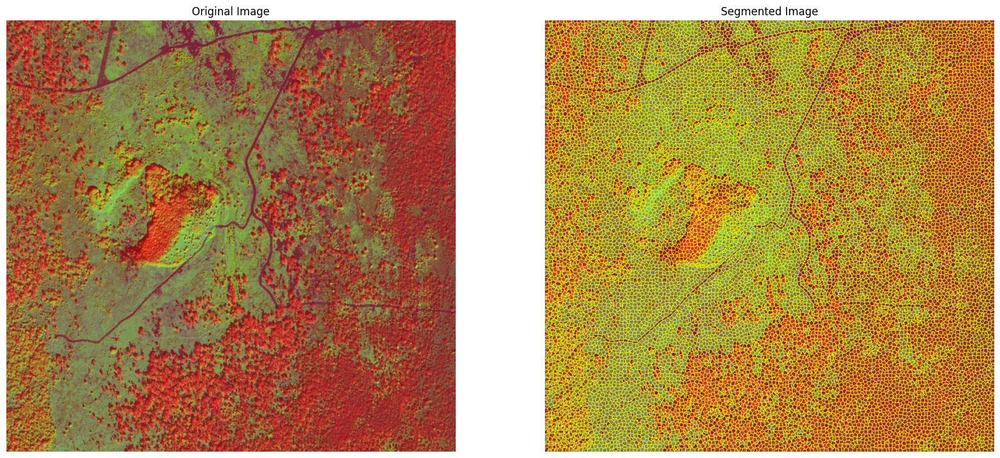

In [4]:
# fig, axs = plt.subplots(1, 2, figsize=(20, 10))

# axs[0].imshow(img.img)
# axs[0].axis('off')
# axs[0].set_title('Original Image') 

# axs[1].imshow(segmented_image.img)
# axs[1].axis('off')
# axs[1].set_title('Segmented Image')

# plt.show()

In [6]:
# import rasterio
# import numpy as np
# from skimage.segmentation import slic

# # Read the file
# with rasterio.open(raster_path) as src:
#     band_r = src.read(8)  # Read R band
#     band_g = src.read(7)  # Read G band
#     band_b = src.read(5)  # Read B band
#     band_z = src.read(9)  # Read Z band

# # Stack bands into a 3D array
# image_xyzrgb = np.dstack((band_z, band_r, band_g, band_b))
# segments = slic(image_xyzrgb, start_label=1, n_segments=15000, compactness=10, max_num_iter=100, sigma=0.5, convert2lab=False, slic_zero=True)

In [96]:
segmented_image.statistics.head()

,segment_id,nobs,b1_min,b1_max,b2_min,b2_max,b3_min,b3_max,b1_mean,b2_mean,...,b2_variance,b3_variance,b1_skewness,b2_skewness,b3_skewness,b1_kurtosis,b2_kurtosis,b3_kurtosis,feature_class,geometry
0,1,259,0.462745,0.525490,0.427451,0.521569,0.364706,0.482353,0.486047,0.479567,...,0.000407,0.000508,0.500891,-0.202184,-0.037657,1.263293,-0.747274,-0.183757,None,"POLYGON ((201382.437 2189050.827, 201382.437 2..."
1,2,281,0.431373,0.549020,0.396078,0.494118,0.313725,0.450980,0.491452,0.445524,...,0.000500,0.000886,-0.235024,0.142512,-0.140917,-0.531701,-0.662319,-0.288630,None,"POLYGON ((201390.096 2189050.827, 201390.096 2..."
2,3,385,0.419608,0.529412,0.411765,0.521569,0.345098,0.490196,0.473084,0.466707,...,0.000569,0.000747,0.171793,-0.152297,-0.019356,-0.433564,-0.877698,-0.236217,None,"POLYGON ((201400.628 2189050.827, 201400.628 2..."
3,4,323,0.494118,0.662745,0.329412,0.505882,0.286275,0.470588,0.578498,0.417167,...,0.001335,0.001289,0.023162,0.132994,0.174331,-0.694325,-0.267434,0.060475,None,"POLYGON ((201408.287 2189050.827, 201408.287 2..."
4,5,245,0.474510,0.619608,0.380392,0.505882,0.333333,0.470588,0.528323,0.444402,...,0.000524,0.000525,0.743097,0.005696,-0.137299,0.325474,0.035604,0.632931,None,"POLYGON ((201417.861 2189050.827, 201417.861 2..."


In [15]:
training_segments = gpd.read_file('/mnt/c/tmp/trial_tiles_2/training.geojson')
training_segments = training_segments.dropna()
feature_counts = training_segments['feature_class'].value_counts()
feature_counts

feature_class
0    710
1    137
2    120
Name: count, dtype: int64

In [77]:
import numpy as np
import shap

from PIL.Image import fromarray
from skimage.util import img_as_float
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler

from obia.handlers import _write_geotiff


class ClassifiedImage:
    crs = None
    transform = None
    original_image = None
    classified_image = None
    confusion_matrix = None
    report = None
    params = None
    shap_values = None
    x_test =None

    def __init__(self, original_image, classified_image, confusion_matrix, report, shap_values, x_test, params):
        self.original_image = original_image
        self.classified_image = classified_image
        self.report = report
        self.confusion_matrix = confusion_matrix
        self.shap_values = shap_values
        self.x_test = x_test
        self.params = params

    def write_geotiff(self, output_path):
        _write_geotiff(self.classified_image, output_path, self.original_image.crs, self.original_image.transform)


def classify(segmented_image, training_classes,
             method='rf', test_size=0.5, compute_reports=False,
             compute_shap=False, **kwargs):
    cm = None
    shap_values = None
    x = training_classes.drop(['feature_class', 'geometry', 'segment_id'], axis=1)
    y = training_classes['feature_class']

    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=test_size, random_state=42)

    scaler = StandardScaler()
    scaler.fit(x_train)
    x_train = scaler.transform(x_train)
    
    scaler = StandardScaler()
    scaler.fit(x_test)
    x_test = scaler.transform(x_test)

    if method == 'rf':
        classifier = RandomForestClassifier(**kwargs)
    elif method == 'mlp':
        classifier = MLPClassifier(**kwargs)
    else:
        raise ValueError('An unsupported classification algorithm was requested')

    classifier.fit(x_train, y_train)
    if compute_shap:
        explainer = None
        if isinstance(classifier, RandomForestClassifier):
            explainer = shap.TreeExplainer(classifier)
        elif isinstance(classifier, MLPClassifier):
            explainer = shap.KernelExplainer(classifier.predict_proba, x_train)

        # explainer = shap.KernelExplainer(classifier, x_train)
        shap_values = explainer(x_train)

    y_pred = classifier.predict(x_test)

    # Compute confusion matrix if requested
    cm = None
    if compute_reports:
        cm = confusion_matrix(y_test, y_pred)
        report = classification_report(y_test, y_pred)

    x_pred = segmented_image.statistics.drop(['feature_class', 'geometry', 'segment_id'], axis=1, errors='ignore')
    scaler = StandardScaler()

    scaler.fit(x_pred)
    x_pred = scaler.transform(x_pred)

    y_pred_all = classifier.predict(x_pred)

    params = classifier.get_params()
    segment_ids = segmented_image.statistics['segment_id'].to_list()
    classified_img = img_as_float(np.array(segmented_image.original_image.img)).copy()

    for i, segment_id in enumerate(segment_ids):
        idx = np.argwhere(segmented_image.segments == segment_id)
        for j in idx:
            classified_img[j[0], j[1], 0] = y_pred_all[i]
    clf = classified_img[:, :, 0] * 255

    min_val = np.min(clf)
    max_val = np.max(clf)
    norm_clf = (clf - min_val) / (max_val - min_val)
    im = fromarray((norm_clf * 255).astype(np.uint8))
    return ClassifiedImage(segmented_image.original_image, im, cm, report, shap_values, x_test, params)


In [78]:
classified = classify(segmented_image, training_segments, method='mlp', compute_shap=True, compute_reports=True)
print(classified.report)
print(classified.confusion_matrix)

/home/milo/miniconda3/envs/gdal_env/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
Using 483 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|          | 0/483 [00:00<?, ?it/s]

              precision    recall  f1-score   support

           0       0.98      0.98      0.98       361
           1       0.85      0.86      0.85        64
           2       0.93      0.90      0.91        59

    accuracy                           0.95       484
   macro avg       0.92      0.91      0.91       484
weighted avg       0.95      0.95      0.95       484

[[353   6   2]
 [  7  55   2]
 [  2   4  53]]


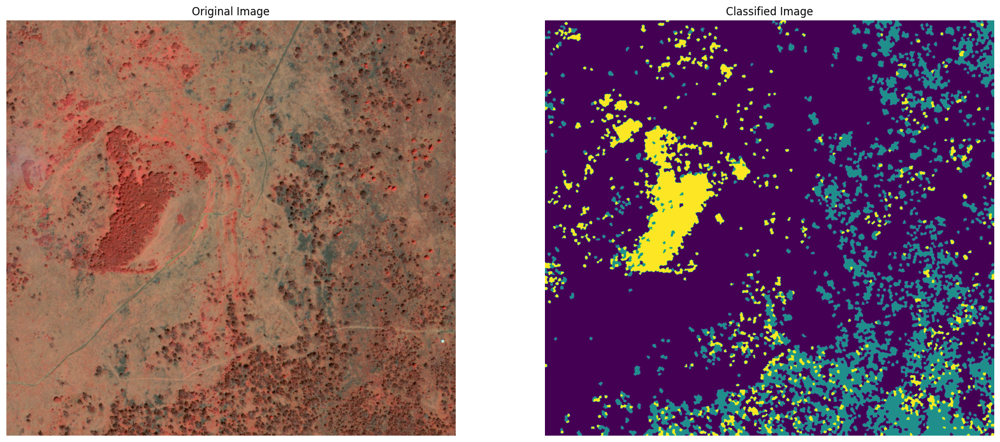

In [44]:
fig, axs = plt.subplots(1, 2, figsize=(20, 10))

axs[0].imshow(img.img)
axs[0].axis('off')
axs[0].set_title('Original Image')

axs[1].imshow(classified.classified_image)
axs[1].axis('off')
axs[1].set_title('Classified Image') 

plt.show()

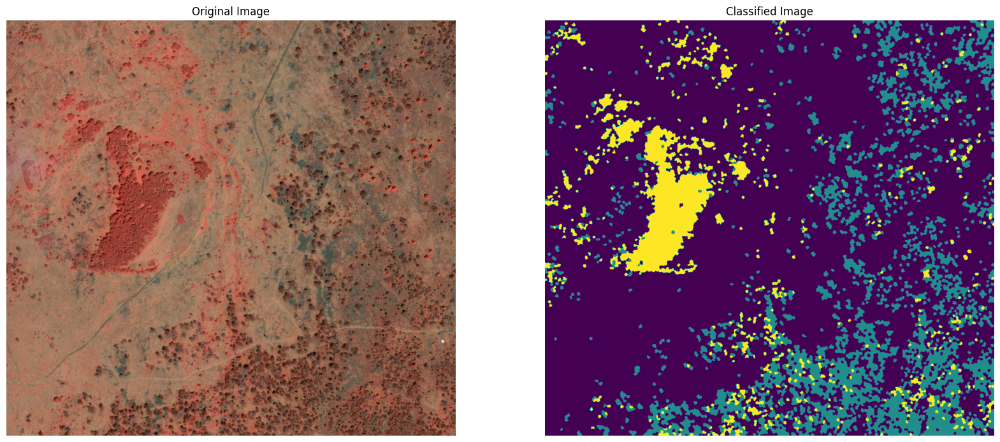

In [79]:
fig, axs = plt.subplots(1, 2, figsize=(20, 10))

axs[0].imshow(img.img)
axs[0].axis('off')
axs[0].set_title('Original Image')

axs[1].imshow(classified.classified_image)
axs[1].axis('off')
axs[1].set_title('Classified Image') 

plt.show()

In [88]:
import shap

print('SHAP Values shape:', classified.shap_values[0].shape)
print('Test data shape:', classified.x_test.shape)
vars = training_segments.drop(['feature_class', 'geometry', 'segment_id'], axis=1, errors='ignore')

SHAP Values shape: (19, 3)
Test data shape: (484, 19)


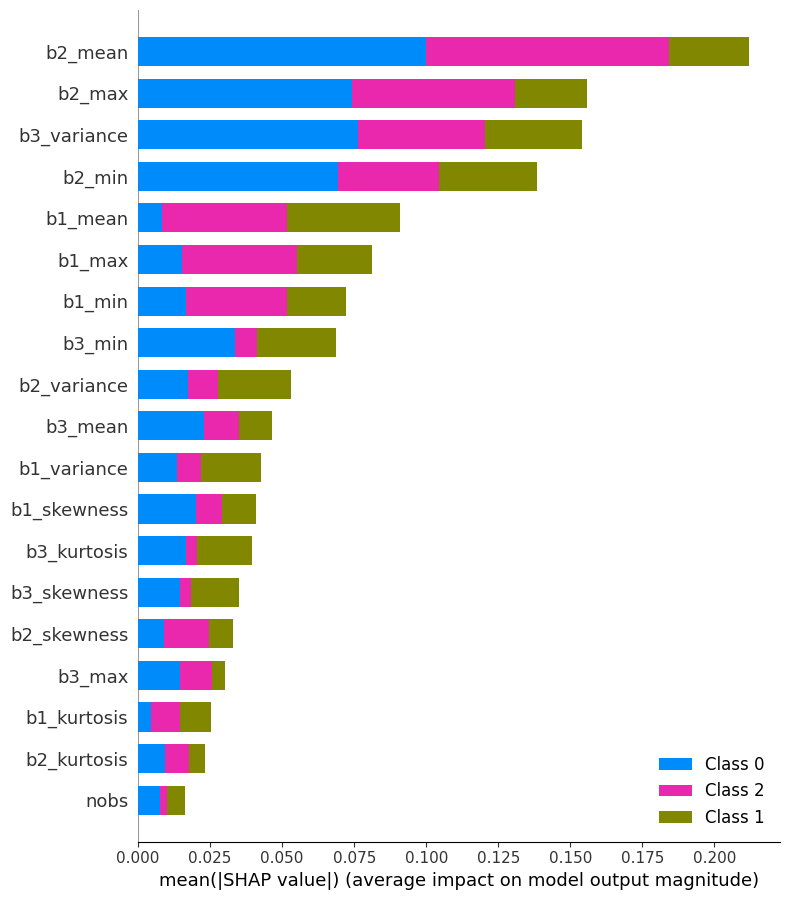

In [80]:
shap_values = classified.shap_values
shap.summary_plot(
    [shap_values[:, :, class_ind].values for class_ind in range(shap_values.shape[-1])],
    feature_names=vars.columns
)

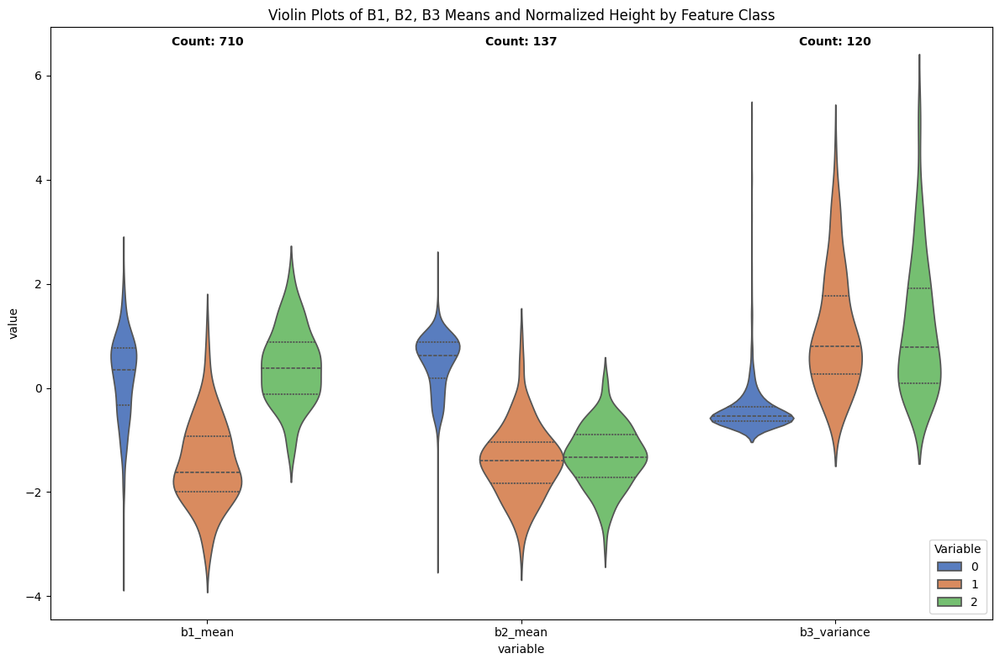

In [90]:
columns_to_standardize = ['b1_mean', 'b2_mean', 'b3_variance']

# Create a StandardScaler object
scaler = StandardScaler()

df = training_segments.copy()
# Apply StandardScaler to the selected columns and replace them in the DataFrame
df[columns_to_standardize] = scaler.fit_transform(training_segments[columns_to_standardize])


long_df = pd.melt(df, id_vars='feature_class', value_vars=columns_to_standardize,
                  var_name='variable', value_name='value')

plt.figure(figsize=(12, 8))
ax = sns.violinplot(hue='feature_class', y='value', x='variable', data=long_df, inner='quartile', palette='muted')

class_counts = df['feature_class'].value_counts()
y_max = ax.get_ylim()[1] * 0.95
feature_classes = df['feature_class'].unique()

for i, feature_class in enumerate(feature_classes):
    count = class_counts.get(feature_class, 0)
    ax.text(i, y_max, f'Count: {count}', horizontalalignment='center', size='medium', color='black', weight='semibold')

plt.title('Violin Plots of B1, B2, B3 Means and Normalized Height by Feature Class')
plt.tight_layout()

ax.legend(title='Variable', loc='lower right', bbox_to_anchor=(1, 0))

plt.show()

Analyzing Segments: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████
/home/milo/miniconda3/envs/gdal_env/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
Using 483 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|          | 0/483 [00:00<?, ?it/s]

              precision    recall  f1-score   support

           0       0.97      0.97      0.97       361
           1       0.87      0.81      0.84        64
           2       0.90      0.95      0.93        59

    accuracy                           0.95       484
   macro avg       0.91      0.91      0.91       484
weighted avg       0.95      0.95      0.95       484

[[351   7   3]
 [  9  52   3]
 [  2   1  56]]


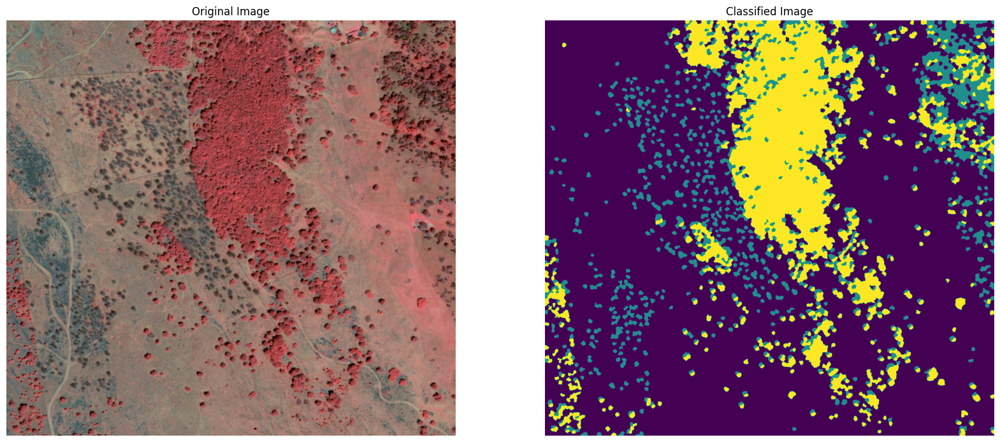

In [94]:
raster_path = f"/mnt/c/tmp/trial_tiles_2/plt8.tif"
img = open_geotiff(raster_path, bands=[8,5,2])
segmented_image = ImageSegments(img, method="slic", n_segments=15000, compactness=10, max_num_iter=100, sigma=0.5, convert2lab=True, slic_zero=True)
classified = classify(segmented_image, training_segments, method='mlp', compute_shap=True, compute_reports=True)
print(classified.report)
print(classified.confusion_matrix)
fig, axs = plt.subplots(1, 2, figsize=(20, 10))

axs[0].imshow(img.img)
axs[0].axis('off')
axs[0].set_title('Original Image')

axs[1].imshow(classified.classified_image)
axs[1].axis('off')
axs[1].set_title('Classified Image') 

plt.show()

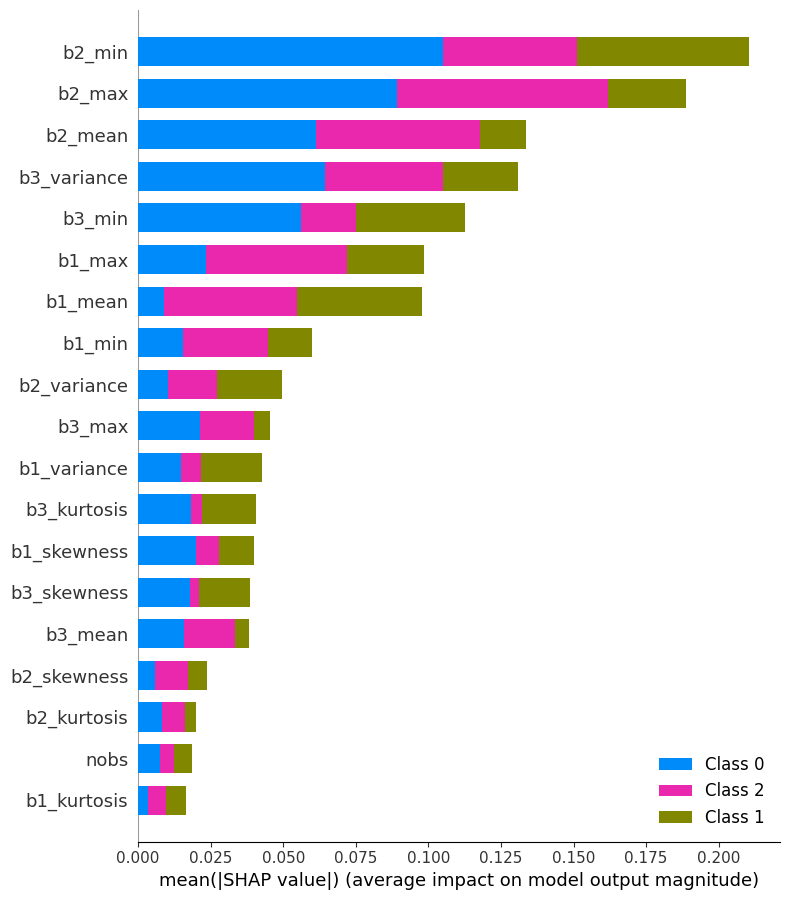

In [92]:
shap_values = classified.shap_values
shap.summary_plot(
    [shap_values[:, :, class_ind].values for class_ind in range(shap_values.shape[-1])],
    feature_names=vars.columns
)

In [ ]:
raster_path = '/mnt/c/tmp/chm_training.tif'

stats = zonal_stats(training_segments, raster_path, stats="mean", geojson_out=True)
stats_segments = zonal_stats(segmented_image.statistics, raster_path, stats="mean", geojson_out=True)

training_segments['height'] = [stat['properties']['mean'] for stat in stats]
segmented_image.statistics['height'] = [stat['properties']['mean'] for stat in stats_segments]

In [95]:
segmented_image.write_segments(f'/mnt/c/tmp/trial_tiles_2/plt8_2.geojson')
classified.write_geotiff("/mnt/c/tmp/trial_tiles_2/plt8_2_classified.tif")

Done Writing GeoTIFF at /mnt/c/tmp/trial_tiles_2/plt8_2_classified.tif
